In [ ]:
import pandas as pd
import random
import numpy as np
import torch
from transformers import AutoTokenizer, AutoModel
from datasets import load_dataset
import gc

import scipy as sp
from scipy import sparse
import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize
from openTSNE import TSNE, affinity, initialization, TSNEEmbedding


import matplotlib.pyplot as plt
import matplotlib as mpl
import glasbey
import seaborn as sns


import pickle
import time
import memory_profiler
from tqdm.notebook import tqdm

%load_ext memory_profiler

from pathlib import Path
import distro

%load_ext watermark

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler
The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark


In [ ]:
# old one '1.8.1+cu111'
torch.__version__

'2.5.0+cu124'

In [ ]:
%load_ext autoreload
%autoreload 2

from text_embeddings_src.legacy.model_stuff import train_loop, fix_all_seeds
from text_embeddings_src.data_stuff import (
    MultOverlappingSentencesPairDataset,
)
from text_embeddings_src.legacy.embeddings import generate_embeddings

from text_embeddings_src.plotting import plot_tsne_colors

In [ ]:
import black
import jupyter_black

jupyter_black.load(line_length=79)

In [ ]:
variables_path = Path("../results/variables")
figures_path = Path("../results/figures/updated_dataset")
data_path = Path("../data")

In [ ]:
# MANUAL FIX TO PATH ISSUE FROM VSCODE
import text_embeddings_src

nb_path = Path(text_embeddings_src.__path__[0]).parents[0] / Path(
    "scripts"
)
assert nb_path.exists(), "The path does not exist"

variables_path = (nb_path / variables_path).resolve(strict=True)
figures_path = (nb_path / figures_path).resolve(strict=True)
data_path = (nb_path / data_path).resolve(strict=True)

In [ ]:
plt.style.use((nb_path / Path("matplotlib_style.txt")).resolve(strict=True))

In [ ]:
%watermark -a 'Rita González-Márquez' -t -d -tz -u -v -iv -w -m -h -p transformers -p openTSNE
print(distro.name(pretty=True))

Author: Rita González-Márquez

Last updated: 2024-12-04 13:22:43CET

Python implementation: CPython
Python version       : 3.12.4
IPython version      : 8.28.0

openTSNE: 1.0.2

Compiler    : GCC 11.2.0
OS          : Linux
Release     : 4.18.0-553.el8_10.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 64
Architecture: 64bit

Hostname: rgonzalesmarquez_GPU0-llm_gber7

matplotlib           : 3.9.2
datasets             : 3.0.1
black                : 24.10.0
openTSNE             : 1.0.2
transformers         : 4.45.2
sentence_transformers: 3.3.0
seaborn              : 0.13.2
distro               : 1.9.0
tqdm                 : 4.66.4
numpy                : 1.26.4
scipy                : 1.11.4
torch                : 2.5.0
pandas               : 2.2.3
memory_profiler      : 0.61.0
mteb                 : 1.19.9
jupyter_black        : 0.4.0
glasbey              : 0.2.1
sklearn              : 1.5.2
text_embeddings_src  : 0.0.0

Watermark: 2.5.0

Ubuntu 24.04 LTS


# Biorxiv
26 classes

In [ ]:
dataset_name = "biorxiv"
dataset_path = "mteb/biorxiv-clustering-p2p"

In [ ]:
dataset = load_dataset(dataset_path)

In [ ]:
print("# samples", len(dataset["test"]["labels"]))
print("# classes", len(np.unique(dataset["test"]["labels"])))

# samples 53787
# classes 26


## Compute t-SNE

### TF-IDF

In [ ]:
%%time

# TfidfVectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True)
tfidf_features = vectorizer.fit_transform(dataset["test"]["sentences"])
print(tfidf_features.shape)

(53787, 168265)
CPU times: user 6.15 s, sys: 94.4 ms, total: 6.24 s
Wall time: 6.25 s


In [ ]:
%%time
%%memit

# TruncatedSVD
svd = TruncatedSVD(n_components=100, random_state=42, algorithm="arpack")
svd_data = svd.fit_transform(tfidf_features)

peak memory: 2565.82 MiB, increment: 281.17 MiB
CPU times: user 7min 28s, sys: 18min 17s, total: 25min 45s
Wall time: 30 s


In [ ]:
# calculate
tsne_l2_svd = TSNE(verbose=True, random_state=42).fit(
    normalize(svd_data, axis=1)
)
#save
np.save(
    variables_path / "updated_dataset" / f"tsne_l2_svd_{dataset_name}",
    tsne_l2_svd,
)

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 38.12 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 1.51 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.31 seconds
===> Running optimization with exaggeration=12.00, lr=4482.25 for 250 iterations...
Iteration   50, KL divergence 6.4934, 50 iterations in 4.0738 sec
Iteration  100, KL divergence 6.5743, 50 iterations in 4.0737 sec
Iteration  150, KL divergence 6.5743, 50 iterations in 4.1174 sec
Iteration  200, KL divergence 6.5737, 50 iterations in 4.1657 sec
Iteration  250, KL divergence 6.5733, 50 iterations in 4.1825 sec
   --> Time elapsed: 20.61 seconds
===> Running optimization with exaggeration=1.00, lr=

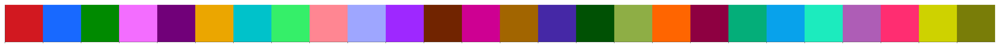

In [ ]:
# glasbey
unique_colors = glasbey.create_palette(
    palette_size=len(np.unique(dataset["test"]["labels"])),
    lightness_bounds=(20, 75),
    chroma_bounds=(50, 90),
)
sns.palplot(unique_colors)

In [ ]:
# colormap
dict_colors = dict(zip(np.unique(dataset["test"]["labels"]), unique_colors))
# colors
colors = np.vectorize(dict_colors.get)(dataset["test"]["labels"])

# save
np.save(variables_path / "updated_dataset" / f"colors_{dataset_name}", colors)
f = open(
    variables_path
    / "updated_dataset"
    / f"dict_label_to_color_{dataset_name}.pkl",
    "wb",
)
pickle.dump(dict_colors, f)
f.close()

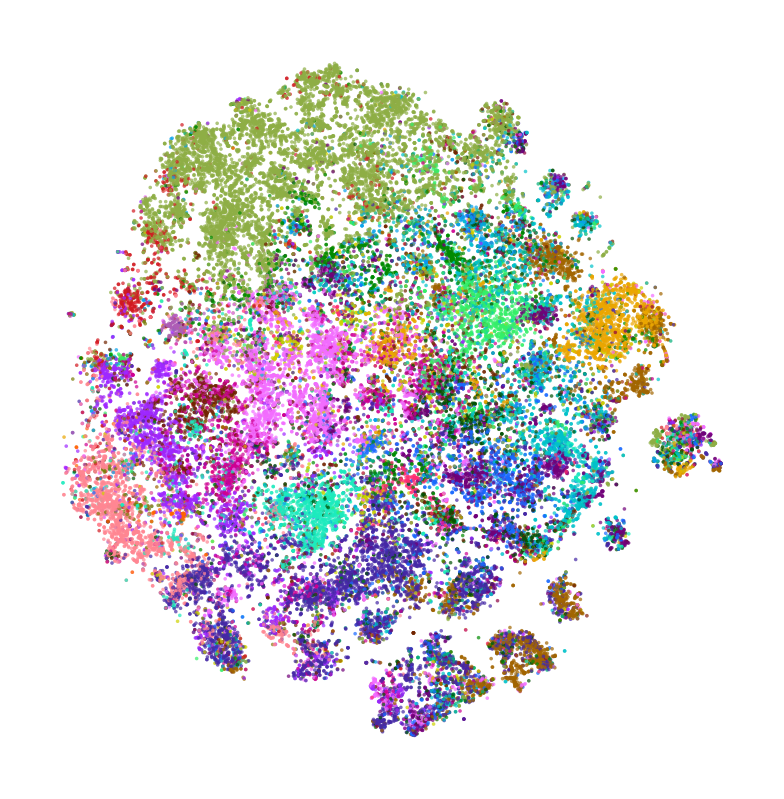

In [ ]:
# plot
plot_tsne_colors(tsne_l2_svd, colors, plot_type="subplot_3")

### Models

In [ ]:
model_names = [
    "MPNet",
    "SBERT",
]

model_paths = [
    "microsoft/mpnet-base",
    "sentence-transformers/all-mpnet-base-v2",
]

In [ ]:
%%time
for i, model_name in enumerate(model_names):
    # fix random seeds
    fix_all_seeds()

    # set up model
    print("Model: ", model_names[i])

    device = "cuda" if torch.cuda.is_available() else "cpu"
    print("Running on device: {}".format(device))

    tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
    model = AutoModel.from_pretrained(model_paths[i])
    model.to(device)

    ## get embeddings
    embedding_cls, embedding_sep, embedding_av = generate_embeddings(
        dataset["test"]["sentences"],
        tokenizer,
        model,
        device,
        batch_size=256,
    )

    # save embeddings
    saving_path = Path("embeddings_" + model_name.lower()) / Path(
        f"updated_dataset/mteb_datasets/{dataset_name}"
    )
    (variables_path / saving_path).mkdir(exist_ok=True, parents=True)

    np.save(
        variables_path / saving_path / "embedding_cls",
        embedding_cls,
    )
    np.save(
        variables_path / saving_path / "embedding_sep",
        embedding_sep,
    )
    np.save(
        variables_path / saving_path / "embedding_av",
        embedding_av,
    )

    ## run t-sne
    tsne_av = TSNE(verbose=True, random_state=42).fit(embedding_av)

    # save
    np.save(
        variables_path / saving_path / "tsne_av",
        tsne_av,
    )

    model = None
    gc.collect()
    torch.cuda.empty_cache()

    print("----------------------------")

Model:  MPNet
Running on device: cuda


/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of MPNetModel were not initialized from the model checkpoint at microsoft/mpnet-base and are newly initialized: ['mpnet.pooler.dense.weight', 'mpnet.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/211 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 168.58 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 1.62 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.56 seconds
===> Running optimization with exaggeration=12.00, lr=4482.25 for 250 iterations...
Iteration   50, KL divergence 6.6225, 50 iterations in 4.2052 sec
Iteration  100, KL divergence 6.6049, 50 iterations in 4.2210 sec
Iteration  150, KL divergence 6.6049, 50 iterations in 4.1838 sec
Iteration  200, KL divergence 6.6044, 50 iterations in 4.1836 sec
Iteration  250, KL divergence 6.6044, 50 iterations in 4.1981 sec
   --> Time elapsed: 20.99 seconds
===> Running optimization with exaggeration=1.00, lr

/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


  0%|          | 0/211 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

### Fine-tuned MPNet (crops)

In [ ]:
model_names = [
    "MPNet",
]


model_paths = [
    "microsoft/mpnet-base",
]

In [ ]:
%%time

# fix random seeds
fix_all_seeds()

# set up model
i = 0
model_name = model_names[i]

print("Model: ", model_name)
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Running on device: {}".format(device))

tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
model = AutoModel.from_pretrained(model_paths[i])
print(model_paths[i])

# data
training_dataset = MultOverlappingSentencesPairDataset(
    pd.Series(dataset["test"]["sentences"]),
    tokenizer,
    device,
)

gen = torch.Generator()
gen.manual_seed(42)
training_loader = torch.utils.data.DataLoader(
    training_dataset, batch_size=64, shuffle=True, generator=gen
)

# training
(
    losses,
    knn_accuracies,
    embedding_cls,
    embedding_sep,
    embedding_av,
) = train_loop(
    model,
    training_loader,
    device,
    dataset["test"]["sentences"],
    tokenizer,
    np.ones(len(dataset["test"]), dtype=bool),
    labels_acc=dataset["test"]["labels"],
    optimized_rep="av",
    n_epochs=1,
    lr=2e-5,
    return_embeddings=True,
)

# save embeddings -- CHNAGE PATHS
saving_path = Path("embeddings_" + model_name.lower()) / Path(
    f"updated_dataset/mteb_datasets/{dataset_name}"
)
(variables_path / saving_path).mkdir(exist_ok=True, parents=True)

np.save(
    variables_path / saving_path / "embedding_cls_after_training_av_1_epoch",
    embedding_cls,
)
np.save(
    variables_path / saving_path / "embedding_sep_after_training_av_1_epoch",
    embedding_sep,
)
np.save(
    variables_path / saving_path / "embedding_av_after_training_av_1_epoch",
    embedding_av,
)

## run t-sne
tsne_av = TSNE(verbose=True, random_state=42).fit(embedding_av)

# save
np.save(
    variables_path / saving_path / "tsne_av_after_training_av_1_epoch",
    tsne_av,
)

print("----------------------------")

Model:  MPNet
Running on device: cuda


/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of MPNetModel were not initialized from the model checkpoint at microsoft/mpnet-base and are newly initialized: ['mpnet.pooler.dense.weight', 'mpnet.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


microsoft/mpnet-base


  0%|          | 0/814 [00:00<?, ?it/s]

  0%|          | 0/211 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 184.92 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 1.40 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.44 seconds
===> Running optimization with exaggeration=12.00, lr=4482.25 for 250 iterations...
Iteration   50, KL divergence 6.7826, 50 iterations in 4.3361 sec
Iteration  100, KL divergence 6.8380, 50 iterations in 4.2668 sec
Iteration  150, KL divergence 6.8376, 50 iterations in 4.0439 sec
Iteration  200, KL divergence 6.8378, 50 iterations in 4.0430 sec
Iteration  250, KL divergence 6.8382, 50 iterations in 4.0703 sec
   --> Time elapsed: 20.76 seconds
===> Running optimization with exaggeration=1.00, lr

## Plot

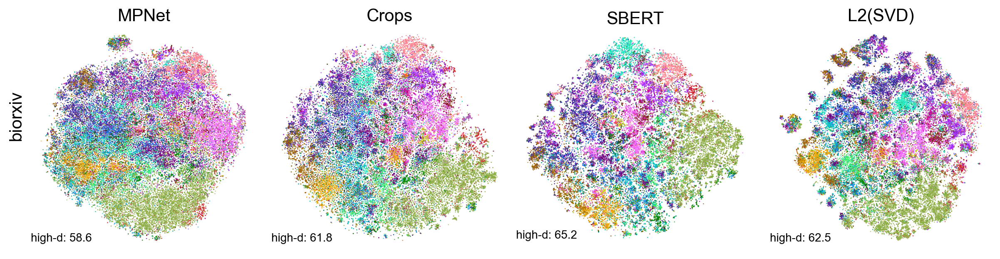

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(12, 3), dpi=200, layout="constrained")
# dataset_name = "biorxiv"
reps = ["MPNet", "Crops", "SBERT", "L2(SVD)"]

# LOAD
## SVD
tsne_l2_svd = np.load(
    variables_path / "updated_dataset" / f"tsne_l2_svd_{dataset_name}.npy",
)
knn_acc_l2_svd = np.load(
    variables_path
    / "updated_dataset"
    / f"knn_accuracy_tfidf_svd_l2_{dataset_name}.npy",
)[2]

## SBERT
saving_path = Path("embeddings_sbert") / Path(
    f"updated_dataset/mteb_datasets/{dataset_name}"
)
tsne_sbert = np.load(
    variables_path / saving_path / "tsne_av.npy",
)
knn_acc_sbert = np.load(
    variables_path / saving_path / "knn_accuracies_baseline.npy",
)[0]
## MPNet
saving_path = Path("embeddings_mpnet") / Path(
    f"updated_dataset/mteb_datasets/{dataset_name}"
)
tsne_mpnet = np.load(
    variables_path / saving_path / "tsne_av.npy",
)
knn_acc_mpnet = np.load(
    variables_path / saving_path / "knn_accuracies_baseline.npy",
)[0]
## Crops
tsne_crops = np.load(
    variables_path / saving_path / "tsne_av_after_training_av_1_epoch.npy",
)
knn_acc_crops = np.load(
    variables_path / saving_path / "knn_accuracies_run1.npy",
)[0][0]

tsnes = [
    tsne_mpnet,
    np.vstack((tsne_crops[:, 0], -tsne_crops[:, 1])).T,
    tsne_sbert,
    np.vstack((-tsne_l2_svd[:, 0], -tsne_l2_svd[:, 1])).T,
]
knn_accs = [knn_acc_mpnet, knn_acc_crops, knn_acc_sbert, knn_acc_l2_svd]

## Colors
colors = np.load(
    variables_path / "updated_dataset" / f"colors_{dataset_name}.npy"
)


# PLOT
for j, tsne in enumerate(tsnes):
    if j == 0:
        axs[j].text(
            -0.1,
            0.5,
            dataset_name,
            transform=axs[j].transAxes,
            rotation="vertical",
            fontsize=15,
        )

    plot_tsne_colors(tsne, colors, ax=axs[j], plot_type="subplot_3")
    axs[j].set_title(reps[j], fontsize=15)

    axs[j].text(
        0,
        0.03,
        f"high-d: {knn_accs[j]*100:.1f}",
        transform=axs[j].transAxes,
        va="bottom",
        ha="left",
        size=10,
    )
    # axs[j].text(
    #     0,
    #     0.01,
    #     f"low-d:  {knn_accuracy_tsne_tfidf*100:.1f}",
    #     transform=axs[i, 0].transAxes,
    #     va="bottom",
    #     ha="left",
    #     size=10,
    # )


fig.savefig(
    figures_path / f"tsne_embeddings_{dataset_name}_with_knn_accs_v1.png"
)

# Medrxiv
51 classes

In [ ]:
dataset_name = "medrxiv"
dataset_path = "mteb/medrxiv-clustering-p2p"

In [ ]:
dataset = load_dataset(dataset_path)

In [ ]:
# dataset["test"]["sentences"],

print("# samples", len(dataset["test"]["labels"]))
print("# classes", len(np.unique(dataset["test"]["labels"])))

# samples 17647
# classes 51


## Compute t-SNE

### TF-IDF

In [ ]:
%%time

# TfidfVectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True)
tfidf_features = vectorizer.fit_transform(dataset["test"]["sentences"])
print(tfidf_features.shape)

(17647, 78739)
CPU times: user 2.35 s, sys: 35.8 ms, total: 2.39 s
Wall time: 2.39 s


In [ ]:
%%time
%%memit

# TruncatedSVD
svd = TruncatedSVD(n_components=100, random_state=42, algorithm="arpack")
svd_data = svd.fit_transform(tfidf_features)

peak memory: 1707.13 MiB, increment: 0.00 MiB
CPU times: user 1min 43s, sys: 4min 21s, total: 6min 5s
Wall time: 8.52 s


In [ ]:
# calculate
tsne_l2_svd = TSNE(verbose=True, random_state=42).fit(
    normalize(svd_data, axis=1)
)
# save
np.save(
    variables_path / "updated_dataset" / f"tsne_l2_svd_{dataset_name}",
    tsne_l2_svd,
)

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...


   --> Time elapsed: 9.12 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 0.48 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.10 seconds
===> Running optimization with exaggeration=12.00, lr=1470.58 for 250 iterations...
Iteration   50, KL divergence 5.4826, 50 iterations in 1.4513 sec
Iteration  100, KL divergence 5.5696, 50 iterations in 1.3990 sec
Iteration  150, KL divergence 5.5710, 50 iterations in 1.4168 sec
Iteration  200, KL divergence 5.5711, 50 iterations in 1.4034 sec
Iteration  250, KL divergence 5.5711, 50 iterations in 1.4599 sec
   --> Time elapsed: 7.13 seconds
===> Running optimization with exaggeration=1.00, lr=17647.00 for 500 iterations...
Iteration   50, KL divergence 2.8233, 50 iterations in 1.4789 sec
Iteration  100, KL divergence 2.6160, 50 iterations in 2.1939 sec
Iteration  150, KL divergence 2.5187, 50 iterations in 3.3191 sec
Iteration  200, KL divergence 2.4600, 50 iterations in 4.5238 sec
Iteration  250, KL di

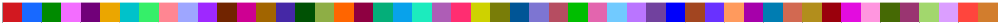

In [ ]:
# glasbey
unique_colors = glasbey.create_palette(
    palette_size=len(np.unique(dataset["test"]["labels"])),
    lightness_bounds=(20, 75),
    chroma_bounds=(50, 90),
)
sns.palplot(unique_colors)

In [ ]:
# colormap
dict_colors = dict(zip(np.unique(dataset["test"]["labels"]), unique_colors))
# colors
colors = np.vectorize(dict_colors.get)(dataset["test"]["labels"])

# save
np.save(variables_path / "updated_dataset" / f"colors_{dataset_name}", colors)
f = open(
    variables_path
    / "updated_dataset"
    / f"dict_label_to_color_{dataset_name}.pkl",
    "wb",
)
pickle.dump(dict_colors, f)
f.close()

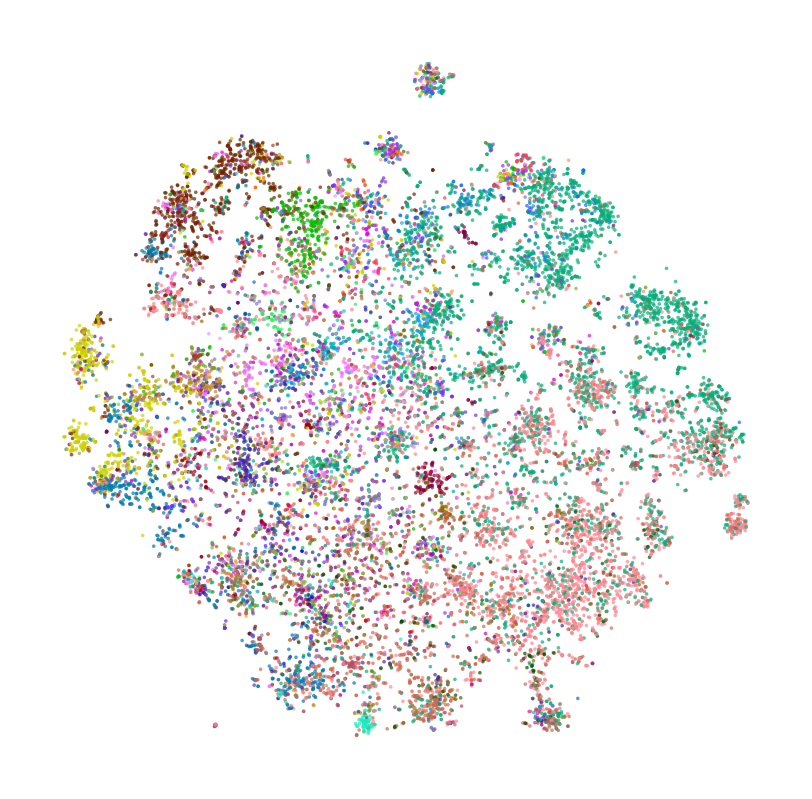

In [ ]:
# plot
plot_tsne_colors(tsne_l2_svd, colors, plot_type="subplot_3")

### Models

In [ ]:
model_names = [
    "MPNet",
    "SBERT",
]

model_paths = [
    "microsoft/mpnet-base",
    "sentence-transformers/all-mpnet-base-v2",
]

In [ ]:
%%time
for i, model_name in enumerate(model_names):
    # fix random seeds
    fix_all_seeds()

    # set up model
    print("Model: ", model_names[i])

    device = "cuda" if torch.cuda.is_available() else "cpu"
    print("Running on device: {}".format(device))

    tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
    model = AutoModel.from_pretrained(model_paths[i])
    model.to(device)

    ## get embeddings
    embedding_cls, embedding_sep, embedding_av = generate_embeddings(
        dataset["test"]["sentences"],
        tokenizer,
        model,
        device,
        batch_size=256,
    )

    # save embeddings
    saving_path = Path("embeddings_" + model_name.lower()) / Path(
        f"updated_dataset/mteb_datasets/{dataset_name}"
    )
    (variables_path / saving_path).mkdir(exist_ok=True, parents=True)

    np.save(
        variables_path / saving_path / "embedding_cls",
        embedding_cls,
    )
    np.save(
        variables_path / saving_path / "embedding_sep",
        embedding_sep,
    )
    np.save(
        variables_path / saving_path / "embedding_av",
        embedding_av,
    )

    ## run t-sne
    tsne_av = TSNE(verbose=True, random_state=42).fit(embedding_av)

    # save
    np.save(
        variables_path / saving_path / "tsne_av",
        tsne_av,
    )

    model = None
    gc.collect()
    torch.cuda.empty_cache()

    print("----------------------------")

Model:  MPNet
Running on device: cuda


/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Some weights of MPNetModel were not initialized from the model checkpoint at microsoft/mpnet-base and are newly initialized: ['mpnet.pooler.dense.weight', 'mpnet.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/69 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 39.81 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 0.51 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.28 seconds
===> Running optimization with exaggeration=12.00, lr=1470.58 for 250 iterations...
Iteration   50, KL divergence 5.5191, 50 iterations in 1.5027 sec
Iteration  100, KL divergence 5.5565, 50 iterations in 1.4809 sec
Iteration  150, KL divergence 5.5571, 50 iterations in 1.4647 sec
Iteration  200, KL divergence 5.5571, 50 iterations in 1.4695 sec
Iteration  250, KL divergence 5.5571, 50 iterations in 1.4685 sec
   --> Time elapsed: 7.39 seconds
===> Running optimization with exaggeration=1.00, lr=1

/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


  0%|          | 0/69 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 39.14 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 0.46 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.31 seconds
===> Running optimization with exaggeration=12.00, lr=1470.58 for 250 iterations...
Iteration   50, KL divergence 5.3504, 50 iterations in 1.5229 sec
Iteration  100, KL divergence 5.4542, 50 iterations in 1.5117 sec
Iteration  150, KL divergence 5.4539, 50 iterations in 1.4877 sec
Iteration  200, KL divergence 5.4539, 50 iterations in 1.4841 sec
Iteration  250, KL divergence 5.4539, 50 iterations in 1.4706 sec
   --> Time elapsed: 7.48 seconds
===> Running optimization with exaggeration=1.00, lr=1

### Fine-tuned MPNet (crops)

In [ ]:
model_names = [
    "MPNet",
]


model_paths = [
    "microsoft/mpnet-base",
]

In [ ]:
%%time

# fix random seeds
fix_all_seeds()

# set up model
i = 0
model_name = model_names[i]

print("Model: ", model_name)
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Running on device: {}".format(device))

tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
model = AutoModel.from_pretrained(model_paths[i])
print(model_paths[i])

# data
training_dataset = MultOverlappingSentencesPairDataset(
    pd.Series(dataset["test"]["sentences"]),
    tokenizer,
    device,
)

gen = torch.Generator()
gen.manual_seed(42)
training_loader = torch.utils.data.DataLoader(
    training_dataset, batch_size=64, shuffle=True, generator=gen
)

# training
(
    losses,
    knn_accuracies,
    embedding_cls,
    embedding_sep,
    embedding_av,
) = train_loop(
    model,
    training_loader,
    device,
    dataset["test"]["sentences"],
    tokenizer,
    np.ones(len(dataset["test"]), dtype=bool),
    labels_acc=dataset["test"]["labels"],
    optimized_rep="av",
    n_epochs=1,
    lr=2e-5,
    return_embeddings=True,
)

# save embeddings -- CHNAGE PATHS
saving_path = Path("embeddings_" + model_name.lower()) / Path(
    f"updated_dataset/mteb_datasets/{dataset_name}"
)
(variables_path / saving_path).mkdir(exist_ok=True, parents=True)

np.save(
    variables_path / saving_path / "embedding_cls_after_training_av_1_epoch",
    embedding_cls,
)
np.save(
    variables_path / saving_path / "embedding_sep_after_training_av_1_epoch",
    embedding_sep,
)
np.save(
    variables_path / saving_path / "embedding_av_after_training_av_1_epoch",
    embedding_av,
)

## run t-sne
tsne_av = TSNE(verbose=True, random_state=42).fit(embedding_av)

# save
np.save(
    variables_path / saving_path / "tsne_av_after_training_av_1_epoch",
    tsne_av,
)

print("----------------------------")

Model:  MPNet
Running on device: cuda


/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of MPNetModel were not initialized from the model checkpoint at microsoft/mpnet-base and are newly initialized: ['mpnet.pooler.dense.weight', 'mpnet.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


microsoft/mpnet-base


  0%|          | 0/265 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 43.50 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 0.46 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.34 seconds
===> Running optimization with exaggeration=12.00, lr=1470.58 for 250 iterations...
Iteration   50, KL divergence 5.6180, 50 iterations in 1.5141 sec
Iteration  100, KL divergence 5.6989, 50 iterations in 1.5463 sec
Iteration  150, KL divergence 5.7005, 50 iterations in 1.5405 sec
Iteration  200, KL divergence 5.7005, 50 iterations in 1.5419 sec
Iteration  250, KL divergence 5.7005, 50 iterations in 1.5795 sec
   --> Time elapsed: 7.72 seconds
===> Running optimization with exaggeration=1.00, lr=1

## Plot

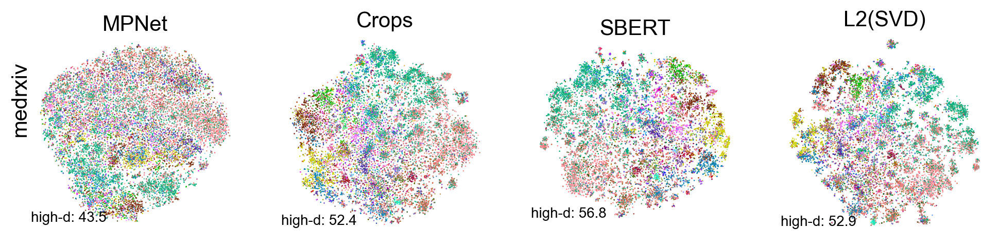

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(12, 3), dpi=200)
# dataset_name = "biorxiv"
reps = ["MPNet", "Crops", "SBERT", "L2(SVD)"]

# LOAD
## SVD
tsne_l2_svd = np.load(
    variables_path / "updated_dataset" / f"tsne_l2_svd_{dataset_name}.npy",
)
knn_acc_l2_svd = np.load(
    variables_path
    / "updated_dataset"
    / f"knn_accuracy_tfidf_svd_l2_{dataset_name}.npy",
)[2]

## SBERT
saving_path = Path("embeddings_sbert") / Path(
    f"updated_dataset/mteb_datasets/{dataset_name}"
)
tsne_sbert = np.load(
    variables_path / saving_path / "tsne_av.npy",
)
knn_acc_sbert = np.load(
    variables_path / saving_path / "knn_accuracies_baseline.npy",
)[0]
## MPNet
saving_path = Path("embeddings_mpnet") / Path(
    f"updated_dataset/mteb_datasets/{dataset_name}"
)
tsne_mpnet = np.load(
    variables_path / saving_path / "tsne_av.npy",
)
knn_acc_mpnet = np.load(
    variables_path / saving_path / "knn_accuracies_baseline.npy",
)[0]
## Crops
tsne_crops = np.load(
    variables_path / saving_path / "tsne_av_after_training_av_1_epoch.npy",
)
knn_acc_crops = np.load(
    variables_path / saving_path / "knn_accuracies_run1.npy",
)[0][0]

tsnes = [tsne_mpnet, tsne_crops, tsne_sbert, tsne_l2_svd]
knn_accs = [knn_acc_mpnet, knn_acc_crops, knn_acc_sbert, knn_acc_l2_svd]

## Colors
colors = np.load(
    variables_path / "updated_dataset" / f"colors_{dataset_name}.npy"
)


# PLOT
for j, tsne in enumerate(tsnes):
    if j == 0:
        axs[j].text(
            -0.1,
            0.5,
            dataset_name,
            transform=axs[j].transAxes,
            rotation="vertical",
            fontsize=15,
        )

    plot_tsne_colors(tsne, colors, ax=axs[j], plot_type="subplot_3")
    axs[j].set_title(reps[j], fontsize=15)

    axs[j].text(
        0,
        0.03,
        f"high-d: {knn_accs[j]*100:.1f}",
        transform=axs[j].transAxes,
        va="bottom",
        ha="left",
        size=10,
    )
    # axs[j].text(
    #     0,
    #     0.01,
    #     f"low-d:  {knn_accuracy_tsne_tfidf*100:.1f}",
    #     transform=axs[i, 0].transAxes,
    #     va="bottom",
    #     ha="left",
    #     size=10,
    # )


fig.savefig(
    figures_path / f"tsne_embeddings_{dataset_name}_with_knn_accs_v1.png"
)

# Reddit
450 classes

## Get dataset

In [ ]:
dataset_name = "reddit"
dataset_path = "mteb/reddit-clustering-p2p"

In [ ]:
dataset = load_dataset(dataset_path)

In [ ]:
sentences = list(
    np.hstack(dataset.data["test"].to_pandas().sentences.to_numpy())
)
labels = list(np.hstack(dataset.data["test"].to_pandas().labels.to_numpy()))

In [ ]:
print("# samples", len(labels))
print("# classes", len(np.unique(labels)))

# samples 459399
# classes 450


## Compute t-SNE

### TF-IDF

In [ ]:
%%time

# TfidfVectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True)
tfidf_features = vectorizer.fit_transform(sentences)
print(tfidf_features.shape)

(459399, 320065)
CPU times: user 28.1 s, sys: 293 ms, total: 28.3 s
Wall time: 28.4 s


In [ ]:
%%time
%%memit

# TruncatedSVD
svd = TruncatedSVD(n_components=100, random_state=42, algorithm="arpack")
svd_data = svd.fit_transform(tfidf_features)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


peak memory: 7927.14 MiB, increment: 1046.18 MiB
CPU times: user 18min 41s, sys: 29min 59s, total: 48min 40s
Wall time: 1min 58s


In [ ]:
# calculate
tsne_l2_svd = TSNE(verbose=True, random_state=42).fit(
    normalize(svd_data, axis=1)
)
# save
np.save(
    variables_path / "updated_dataset" / f"tsne_l2_svd_{dataset_name}",
    tsne_l2_svd,
)

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 560.78 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 14.97 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 1.61 seconds
===> Running optimization with exaggeration=12.00, lr=38283.25 for 250 iterations...
Iteration   50, KL divergence 8.7693, 50 iterations in 46.1967 sec
Iteration  100, KL divergence 8.8208, 50 iterations in 43.3547 sec
Iteration  150, KL divergence 8.8218, 50 iterations in 42.8008 sec
Iteration  200, KL divergence 8.8220, 50 iterations in 52.0195 sec
Iteration  250, KL divergence 8.8215, 50 iterations in 53.4162 sec
   --> Time elapsed: 237.79 seconds
===> Running optimization with exaggeration=

In [ ]:
# glasbey
unique_colors = glasbey.create_palette(
    palette_size=len(np.unique(labels)),
    lightness_bounds=(20, 75),
    chroma_bounds=(50, 90),
)
# sns.palplot(unique_colors)

In [ ]:
# colormap
dict_colors = dict(zip(np.unique(labels), unique_colors))
# colors
colors = np.vectorize(dict_colors.get)(labels)

# save
np.save(variables_path / "updated_dataset" / f"colors_{dataset_name}", colors)
f = open(
    variables_path
    / "updated_dataset"
    / f"dict_label_to_color_{dataset_name}.pkl",
    "wb",
)
pickle.dump(dict_colors, f)
f.close()

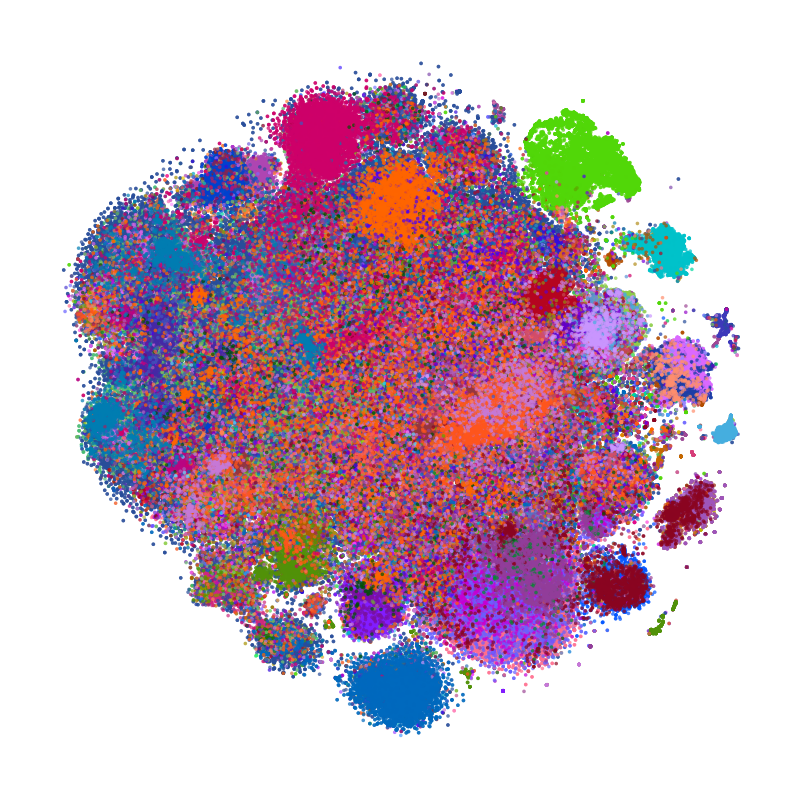

In [ ]:
# plot
plot_tsne_colors(tsne_l2_svd, colors, plot_type="subplot_3")

#### Directly from TF-IDF features


In [ ]:
%%time
A = affinity.Uniform(
    tfidf_features, k_neighbors=10, n_jobs=-1, verbose=1, random_state=42
)

/.pyenv/versions/miniconda3-latest/lib/python3.12/site-packages/openTSNE/nearest_neighbors.py:436: UserWarning: `pynndescent` has recently changed which distance metrics are supported, and `openTSNE.nearest_neighbors` has not been updated. Please notify the developers of this change.
  warnings.warn(


===> Finding 10 nearest neighbors using NN descent approximate search using euclidean distance...
   --> Time elapsed: 90.15 seconds
CPU times: user 47min 16s, sys: 9.78 s, total: 47min 26s
Wall time: 1min 34s


/.pyenv/versions/miniconda3-latest/lib/python3.12/site-packages/openTSNE/affinity.py:1219: FutureWarning: Using `mean` symmetrization, but the default behaviour is going to change to `max` in future versions.
  warnings.warn(


In [ ]:
%%time

I = initialization.pca(tfidf_features, random_state=42)

CPU times: user 54 s, sys: 5min 13s, total: 6min 7s
Wall time: 9.27 s


In [ ]:
%%time

E = TSNEEmbedding(I, A, n_jobs=-1, random_state=42, verbose=True)

# early exaggeration
E = E.optimize(
    n_iter=250,
    exaggeration=12,
    momentum=0.5,
    n_jobs=-1,
    verbose=True,
)

# final optimization without exaggeration
E = E.optimize(
    n_iter=500,
    exaggeration=1,
    momentum=0.8,
    n_jobs=-1,
    verbose=True,
)

tsne = np.array(E)

# save
np.save(
    variables_path / "updated_dataset" / f"tsne_tfidf_{dataset_name}",
    tsne,
)

===> Running optimization with exaggeration=12.00, lr=38283.25 for 250 iterations...


Iteration   50, KL divergence 214.1126, 50 iterations in 6.5423 sec
Iteration  100, KL divergence 193.6535, 50 iterations in 7.3117 sec
Iteration  150, KL divergence 183.1013, 50 iterations in 7.7514 sec
Iteration  200, KL divergence 190.5836, 50 iterations in 7.5311 sec
Iteration  250, KL divergence 194.6279, 50 iterations in 6.9570 sec
   --> Time elapsed: 36.09 seconds
===> Running optimization with exaggeration=1.00, lr=459399.00 for 500 iterations...
Iteration   50, KL divergence 162.6258, 50 iterations in 7.1597 sec
Iteration  100, KL divergence 162.0709, 50 iterations in 7.1464 sec
Iteration  150, KL divergence 162.8952, 50 iterations in 7.2426 sec
Iteration  200, KL divergence 159.2543, 50 iterations in 7.3120 sec
Iteration  250, KL divergence 157.4502, 50 iterations in 7.4385 sec
Iteration  300, KL divergence 159.0306, 50 iterations in 7.1763 sec
Iteration  350, KL divergence 156.2202, 50 iterations in 7.3514 sec
Iteration  400, KL divergence 157.9901, 50 iterations in 7.2657 

In [ ]:
colors = np.load(
    variables_path / "updated_dataset" / f"colors_{dataset_name}.npy"
)

pickle_in = open(
    variables_path
    / "updated_dataset"
    / f"dict_label_to_color_{dataset_name}.pkl",
    "rb",
)
dict_label_to_color = pickle.load(pickle_in)

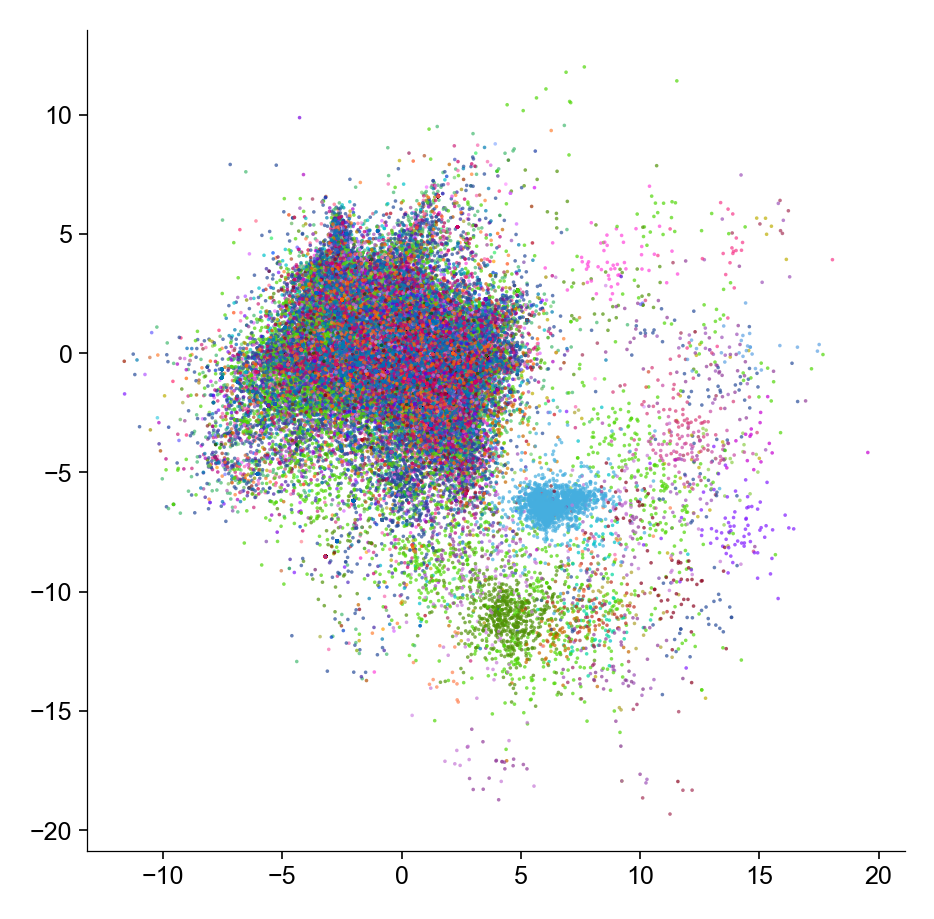

In [ ]:
# plot
fig, ax = plt.subplots(figsize=(3, 3), dpi=300, layout="constrained")

plot_tsne_colors(tsne, colors, plot_type="subplot_3", ax=ax, axis_on=True)

fig.savefig(figures_path / "tsne_tfidf_reddit.png")

### Models

In [ ]:
model_names = [
    "MPNet",
    "SBERT",
]

model_paths = [
    "microsoft/mpnet-base",
    "sentence-transformers/all-mpnet-base-v2",
]

In [ ]:
%%time
for i, model_name in enumerate(model_names):
    # fix random seeds
    fix_all_seeds()

    # set up model
    print("Model: ", model_names[i])

    device = "cuda" if torch.cuda.is_available() else "cpu"
    print("Running on device: {}".format(device))

    tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
    model = AutoModel.from_pretrained(model_paths[i])
    model.to(device)

    ## get embeddings
    embedding_cls, embedding_sep, embedding_av = generate_embeddings(
        sentences,
        tokenizer,
        model,
        device,
        batch_size=256,
    )

    # save embeddings
    saving_path = Path("embeddings_" + model_name.lower()) / Path(
        f"updated_dataset/mteb_datasets/{dataset_name}"
    )
    (variables_path / saving_path).mkdir(exist_ok=True, parents=True)

    np.save(
        variables_path / saving_path / "embedding_cls",
        embedding_cls,
    )
    np.save(
        variables_path / saving_path / "embedding_sep",
        embedding_sep,
    )
    np.save(
        variables_path / saving_path / "embedding_av",
        embedding_av,
    )

    ## run t-sne
    tsne_av = TSNE(verbose=True, random_state=42).fit(embedding_av)

    # save
    np.save(
        variables_path / saving_path / "tsne_av",
        tsne_av,
    )

    model = None
    gc.collect()
    torch.cuda.empty_cache()

    print("----------------------------")

Model:  MPNet
Running on device: cuda


/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of MPNetModel were not initialized from the model checkpoint at microsoft/mpnet-base and are newly initialized: ['mpnet.pooler.dense.weight', 'mpnet.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/1795 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 2016.36 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 18.15 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 3.72 seconds
===> Running optimization with exaggeration=12.00, lr=38283.25 for 250 iterations...
Iteration   50, KL divergence 8.3359, 50 iterations in 55.2154 sec
Iteration  100, KL divergence 8.3816, 50 iterations in 56.0144 sec
Iteration  150, KL divergence 8.3782, 50 iterations in 56.6312 sec
Iteration  200, KL divergence 8.3769, 50 iterations in 56.0362 sec
Iteration  250, KL divergence 8.3767, 50 iterations in 54.8919 sec
   --> Time elapsed: 278.79 seconds
===> Running optimization with exaggeration

/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.11/site-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


  0%|          | 0/1795 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 1862.18 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 14.20 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 2.96 seconds
===> Running optimization with exaggeration=12.00, lr=38283.25 for 250 iterations...
Iteration   50, KL divergence 8.0012, 50 iterations in 39.9066 sec
Iteration  100, KL divergence 8.0610, 50 iterations in 40.1064 sec
Iteration  150, KL divergence 8.0685, 50 iterations in 40.0470 sec
Iteration  200, KL divergence 8.0698, 50 iterations in 40.1945 sec
Iteration  250, KL divergence 8.0700, 50 iterations in 40.1694 sec
   --> Time elapsed: 200.42 seconds
===> Running optimization with exaggeration

### Fine-tuned MPNet (crops)

In [ ]:
model_names = [
    "MPNet",
]


model_paths = [
    "microsoft/mpnet-base",
]

In [ ]:
%%time

# fix random seeds
fix_all_seeds()

# set up model
i = 0
model_name = model_names[i]

print("Model: ", model_name)
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Running on device: {}".format(device))

tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
model = AutoModel.from_pretrained(model_paths[i])
print(model_paths[i])

# data
training_dataset = MultOverlappingSentencesPairDataset(
    pd.Series(sentences),
    tokenizer,
    device,
)

gen = torch.Generator()
gen.manual_seed(42)
training_loader = torch.utils.data.DataLoader(
    training_dataset, batch_size=32, shuffle=True, generator=gen
)

# training
(
    losses,
    knn_accuracies,
    embedding_cls,
    embedding_sep,
    embedding_av,
) = train_loop(
    model,
    training_loader,
    device,
    sentences,
    tokenizer,
    np.ones(len(sentences), dtype=bool),
    labels_acc=labels,
    optimized_rep="av",
    n_epochs=1,
    lr=2e-5,
    return_embeddings=True,
)

# save embeddings -- CHNAGE PATHS
saving_path = Path("embeddings_" + model_name.lower()) / Path(
    f"updated_dataset/mteb_datasets/{dataset_name}"
)
(variables_path / saving_path).mkdir(exist_ok=True, parents=True)

np.save(
    variables_path / saving_path / "embedding_cls_after_training_av_1_epoch",
    embedding_cls,
)
np.save(
    variables_path / saving_path / "embedding_sep_after_training_av_1_epoch",
    embedding_sep,
)
np.save(
    variables_path / saving_path / "embedding_av_after_training_av_1_epoch",
    embedding_av,
)

## run t-sne
tsne_av = TSNE(verbose=True, random_state=42).fit(embedding_av)

# save
np.save(
    variables_path / saving_path / "tsne_av_after_training_av_1_epoch",
    tsne_av,
)

print("----------------------------")

Model:  MPNet
Running on device: cuda


Some weights of MPNetModel were not initialized from the model checkpoint at microsoft/mpnet-base and are newly initialized: ['mpnet.pooler.dense.bias', 'mpnet.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


microsoft/mpnet-base


  0%|          | 0/4505 [00:00<?, ?it/s]

  0%|          | 0/1795 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 1883.30 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 15.56 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 2.76 seconds
===> Running optimization with exaggeration=12.00, lr=38283.25 for 250 iterations...
Iteration   50, KL divergence 8.0542, 50 iterations in 44.4441 sec
Iteration  100, KL divergence 8.0737, 50 iterations in 43.8087 sec
Iteration  150, KL divergence 8.0720, 50 iterations in 44.2397 sec
Iteration  200, KL divergence 8.0687, 50 iterations in 44.4836 sec
Iteration  250, KL divergence 8.0673, 50 iterations in 44.4850 sec
   --> Time elapsed: 221.46 seconds
===> Running optimization with exaggeration

## Plot

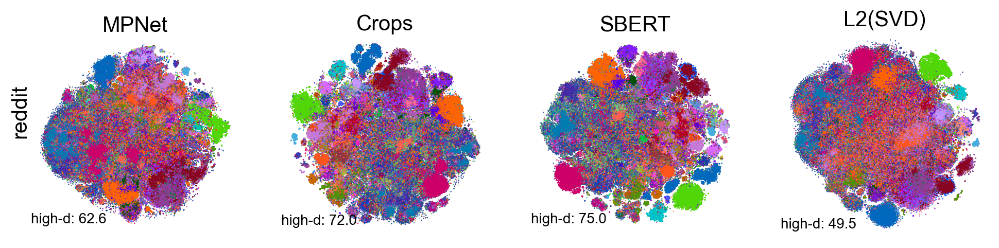

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(12, 3), dpi=200)
# dataset_name = "biorxiv"
reps = ["MPNet", "Crops", "SBERT", "L2(SVD)"]

# LOAD
## SVD
tsne_l2_svd = np.load(
    variables_path / "updated_dataset" / f"tsne_l2_svd_{dataset_name}.npy",
)
knn_acc_l2_svd = np.load(
    variables_path
    / "updated_dataset"
    / f"knn_accuracy_tfidf_svd_l2_{dataset_name}.npy",
)[2]

## SBERT
saving_path = Path("embeddings_sbert") / Path(
    f"updated_dataset/mteb_datasets/{dataset_name}"
)
tsne_sbert = np.load(
    variables_path / saving_path / "tsne_av.npy",
)
knn_acc_sbert = np.load(
    variables_path / saving_path / "knn_accuracies_baseline.npy",
)[0]
## MPNet
saving_path = Path("embeddings_mpnet") / Path(
    f"updated_dataset/mteb_datasets/{dataset_name}"
)
tsne_mpnet = np.load(
    variables_path / saving_path / "tsne_av.npy",
)
knn_acc_mpnet = np.load(
    variables_path / saving_path / "knn_accuracies_baseline.npy",
)[0]
## Crops
tsne_crops = np.load(
    variables_path / saving_path / "tsne_av_after_training_av_1_epoch.npy",
)
knn_acc_crops = np.load(
    variables_path / saving_path / "knn_accuracies_run1.npy",
)[0][0]

tsnes = [tsne_mpnet, tsne_crops, tsne_sbert, tsne_l2_svd]
knn_accs = [knn_acc_mpnet, knn_acc_crops, knn_acc_sbert, knn_acc_l2_svd]

## Colors
colors = np.load(
    variables_path / "updated_dataset" / f"colors_{dataset_name}.npy"
)
# pickle_in = open(
#     variables_path / "updated_dataset" / f"dict_label_to_color_{dataset_name}.pkl", "rb"
# )
# dict_label_to_color = pickle.load(pickle_in)

# PLOT
for j, tsne in enumerate(tsnes):
    if j == 0:
        axs[j].text(
            -0.1,
            0.5,
            dataset_name,
            transform=axs[j].transAxes,
            rotation="vertical",
            fontsize=15,
        )

    plot_tsne_colors(tsne, colors, ax=axs[j], plot_type="subplot_3")
    axs[j].set_title(reps[j], fontsize=15)

    axs[j].text(
        0,
        0.03,
        f"high-d: {knn_accs[j]*100:.1f}",
        transform=axs[j].transAxes,
        va="bottom",
        ha="left",
        size=10,
    )
    # axs[j].text(
    #     0,
    #     0.01,
    #     f"low-d:  {knn_accuracy_tsne_tfidf*100:.1f}",
    #     transform=axs[i, 0].transAxes,
    #     va="bottom",
    #     ha="left",
    #     size=10,
    # )


fig.savefig(
    figures_path / f"tsne_embeddings_{dataset_name}_with_knn_accs_v1.png"
)

# Stackexchange

## Get dataset

In [ ]:
dataset_name = "stackexchange"
dataset_path = "mteb/stackexchange-clustering-p2p"

In [ ]:
dataset = load_dataset(dataset_path)

In [ ]:
sentences = list(
    np.hstack(dataset.data["test"].to_pandas().sentences.to_numpy())
)
labels = list(np.hstack(dataset.data["test"].to_pandas().labels.to_numpy()))

In [ ]:
print("# samples", len(labels))
print("# classes", len(np.unique(labels)))

# samples 75000
# classes 610


## Compute t-SNE

### TF-IDF

In [ ]:
%%time

# TfidfVectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True)
tfidf_features = vectorizer.fit_transform(sentences)
print(tfidf_features.shape)

(75000, 120133)
CPU times: user 5.82 s, sys: 208 ms, total: 6.03 s
Wall time: 6.03 s


In [ ]:
%%time
%%memit

# TruncatedSVD
svd = TruncatedSVD(n_components=100, random_state=42, algorithm="arpack")
svd_data = svd.fit_transform(tfidf_features)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


peak memory: 44556.53 MiB, increment: 616.41 MiB
CPU times: user 8min 17s, sys: 18min 35s, total: 26min 52s
Wall time: 30.8 s


In [ ]:
# calculate
tsne_l2_svd = TSNE(verbose=True, random_state=42).fit(
    normalize(svd_data, axis=1)
)
# save
np.save(
    variables_path / "updated_dataset" / f"tsne_l2_svd_{dataset_name}",
    tsne_l2_svd,
)

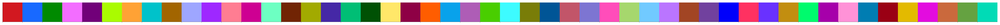

In [ ]:
# glasbey
unique_colors = glasbey.create_palette(
    palette_size=len(np.unique(labels)),
    lightness_bounds=(20, 90),
    chroma_bounds=(50, 90),
)
sns.palplot(unique_colors[:50])

In [ ]:
# colormap
dict_colors = dict(zip(np.unique(labels), unique_colors))
# colors
colors = np.vectorize(dict_colors.get)(labels)

# save
np.save(variables_path / "updated_dataset" / f"colors_{dataset_name}", colors)
f = open(
    variables_path
    / "updated_dataset"
    / f"dict_label_to_color_{dataset_name}.pkl",
    "wb",
)
pickle.dump(dict_colors, f)
f.close()

In [ ]:
# save
tsne_l2_svd = np.load(
    variables_path / "updated_dataset" / f"tsne_l2_svd_{dataset_name}.npy",
)

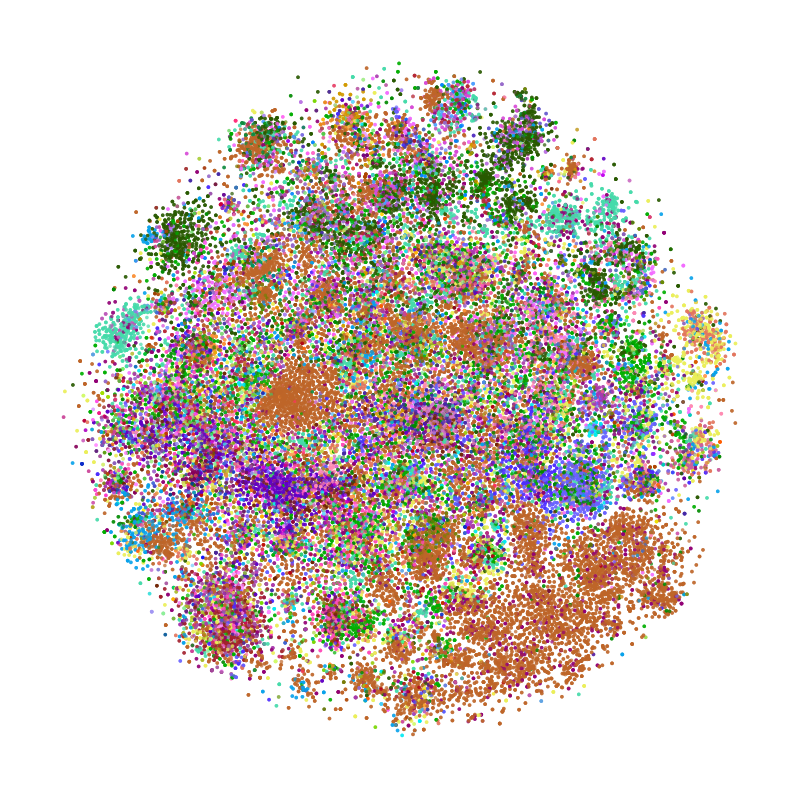

In [ ]:
# plot
plot_tsne_colors(tsne_l2_svd, colors, plot_type="subplot_3")

### Models

In [ ]:
model_names = [
    "MPNet",
    "SBERT",
]

model_paths = [
    "microsoft/mpnet-base",
    "sentence-transformers/all-mpnet-base-v2",
]

In [ ]:
%%time
for i, model_name in enumerate(model_names):
    # fix random seeds
    fix_all_seeds()

    # set up model
    print("Model: ", model_names[i])

    device = "cuda" if torch.cuda.is_available() else "cpu"
    print("Running on device: {}".format(device))

    tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
    model = AutoModel.from_pretrained(model_paths[i])
    model.to(device)

    ## get embeddings
    embedding_cls, embedding_sep, embedding_av = generate_embeddings(
        sentences,
        tokenizer,
        model,
        device,
        batch_size=256,
    )

    # save embeddings
    saving_path = Path("embeddings_" + model_name.lower()) / Path(
        f"updated_dataset/mteb_datasets/{dataset_name}"
    )
    (variables_path / saving_path).mkdir(exist_ok=True, parents=True)

    np.save(
        variables_path / saving_path / "embedding_cls",
        embedding_cls,
    )
    np.save(
        variables_path / saving_path / "embedding_sep",
        embedding_sep,
    )
    np.save(
        variables_path / saving_path / "embedding_av",
        embedding_av,
    )

    ## run t-sne
    tsne_av = TSNE(verbose=True, random_state=42).fit(embedding_av)

    # save
    np.save(
        variables_path / saving_path / "tsne_av",
        tsne_av,
    )

    model = None
    gc.collect()
    torch.cuda.empty_cache()

    print("----------------------------")

Model:  MPNet
Running on device: cuda


Some weights of MPNetModel were not initialized from the model checkpoint at microsoft/mpnet-base and are newly initialized: ['mpnet.pooler.dense.bias', 'mpnet.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/293 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 248.59 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 2.54 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.98 seconds
===> Running optimization with exaggeration=12.00, lr=6250.00 for 250 iterations...
Iteration   50, KL divergence 6.4404, 50 iterations in 6.7485 sec
Iteration  100, KL divergence 6.5020, 50 iterations in 6.6583 sec
Iteration  150, KL divergence 6.5051, 50 iterations in 6.8408 sec
Iteration  200, KL divergence 6.5051, 50 iterations in 6.6553 sec
Iteration  250, KL divergence 6.5051, 50 iterations in 6.8940 sec
   --> Time elapsed: 33.80 seconds
===> Running optimization with exaggeration=1.00, lr

  0%|          | 0/293 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 277.41 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 2.37 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.82 seconds
===> Running optimization with exaggeration=12.00, lr=6250.00 for 250 iterations...
Iteration   50, KL divergence 6.9006, 50 iterations in 6.2784 sec
Iteration  100, KL divergence 6.9447, 50 iterations in 6.6710 sec
Iteration  150, KL divergence 6.9455, 50 iterations in 6.8444 sec
Iteration  200, KL divergence 6.9455, 50 iterations in 6.3406 sec
Iteration  250, KL divergence 6.9455, 50 iterations in 6.6706 sec
   --> Time elapsed: 32.81 seconds
===> Running optimization with exaggeration=1.00, lr

### Fine-tuned MPNet (crops)

In [ ]:
model_names = [
    "MPNet",
]


model_paths = [
    "microsoft/mpnet-base",
]

In [ ]:
%%time

# fix random seeds
fix_all_seeds()

# set up model
i = 0
model_name = model_names[i]

print("Model: ", model_name)
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Running on device: {}".format(device))

tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
model = AutoModel.from_pretrained(model_paths[i])
print(model_paths[i])

# data
training_dataset = MultOverlappingSentencesPairDataset(
    pd.Series(sentences),
    tokenizer,
    device,
)

gen = torch.Generator()
gen.manual_seed(42)
training_loader = torch.utils.data.DataLoader(
    training_dataset, batch_size=64, shuffle=True, generator=gen
)

# training
(
    losses,
    knn_accuracies,
    embedding_cls,
    embedding_sep,
    embedding_av,
) = train_loop(
    model,
    training_loader,
    device,
    sentences,
    tokenizer,
    np.ones(len(sentences), dtype=bool),
    labels_acc=labels,
    optimized_rep="av",
    n_epochs=1,
    lr=2e-5,
    return_embeddings=True,
)

# save embeddings -- CHNAGE PATHS
saving_path = Path("embeddings_" + model_name.lower()) / Path(
    f"updated_dataset/mteb_datasets/{dataset_name}"
)
(variables_path / saving_path).mkdir(exist_ok=True, parents=True)

np.save(
    variables_path / saving_path / "embedding_cls_after_training_av_1_epoch",
    embedding_cls,
)
np.save(
    variables_path / saving_path / "embedding_sep_after_training_av_1_epoch",
    embedding_sep,
)
np.save(
    variables_path / saving_path / "embedding_av_after_training_av_1_epoch",
    embedding_av,
)

## run t-sne
tsne_av = TSNE(verbose=True, random_state=42).fit(embedding_av)

# save
np.save(
    variables_path / saving_path / "tsne_av_after_training_av_1_epoch",
    tsne_av,
)

print("----------------------------")

Model:  MPNet
Running on device: cuda


Some weights of MPNetModel were not initialized from the model checkpoint at microsoft/mpnet-base and are newly initialized: ['mpnet.pooler.dense.bias', 'mpnet.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


microsoft/mpnet-base


  0%|          | 0/650 [00:00<?, ?it/s]

  0%|          | 0/293 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 279.93 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 2.18 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.80 seconds
===> Running optimization with exaggeration=12.00, lr=6250.00 for 250 iterations...
Iteration   50, KL divergence 6.8576, 50 iterations in 6.3669 sec
Iteration  100, KL divergence 6.9035, 50 iterations in 6.5865 sec
Iteration  150, KL divergence 6.9043, 50 iterations in 6.4629 sec
Iteration  200, KL divergence 6.9043, 50 iterations in 6.8566 sec
Iteration  250, KL divergence 6.9043, 50 iterations in 6.7228 sec
   --> Time elapsed: 33.00 seconds
===> Running optimization with exaggeration=1.00, lr

## Plot

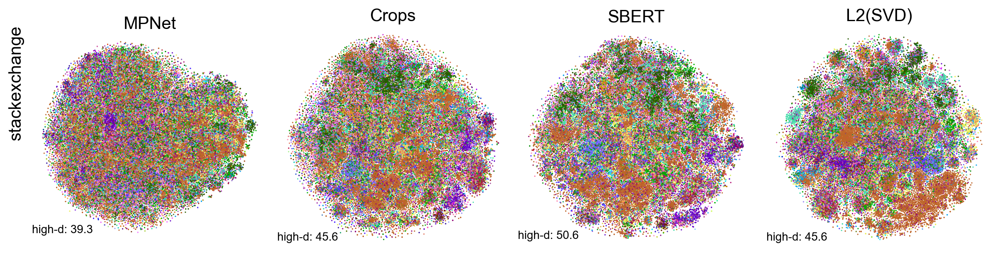

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(12, 3), dpi=200, layout="constrained")
# dataset_name = "biorxiv"
reps = ["MPNet", "Crops", "SBERT", "L2(SVD)"]

# LOAD
## SVD
tsne_l2_svd = np.load(
    variables_path / "updated_dataset" / f"tsne_l2_svd_{dataset_name}.npy",
)
knn_acc_l2_svd = np.load(
    variables_path
    / "updated_dataset"
    / f"knn_accuracy_tfidf_svd_l2_{dataset_name}.npy",
)[2]

## SBERT
saving_path = Path("embeddings_sbert") / Path(
    f"updated_dataset/mteb_datasets/{dataset_name}"
)
tsne_sbert = np.load(
    variables_path / saving_path / "tsne_av.npy",
)
knn_acc_sbert = np.load(
    variables_path / saving_path / "knn_accuracies_baseline.npy",
)[0]
## MPNet
saving_path = Path("embeddings_mpnet") / Path(
    f"updated_dataset/mteb_datasets/{dataset_name}"
)
tsne_mpnet = np.load(
    variables_path / saving_path / "tsne_av.npy",
)
knn_acc_mpnet = np.load(
    variables_path / saving_path / "knn_accuracies_baseline.npy",
)[0]
## Crops
tsne_crops = np.load(
    variables_path / saving_path / "tsne_av_after_training_av_1_epoch.npy",
)
knn_acc_crops = np.load(
    variables_path / saving_path / "knn_accuracies_run1.npy",
)[0][0]

tsnes = [tsne_mpnet, tsne_crops, tsne_sbert, tsne_l2_svd]
knn_accs = [knn_acc_mpnet, knn_acc_crops, knn_acc_sbert, knn_acc_l2_svd]

## Colors
colors = np.load(
    variables_path / "updated_dataset" / f"colors_{dataset_name}.npy"
)
# pickle_in = open(
#     variables_path / "updated_dataset" / f"dict_label_to_color_{dataset_name}.pkl", "rb"
# )
# dict_label_to_color = pickle.load(pickle_in)

# PLOT
for j, tsne in enumerate(tsnes):
    if j == 0:
        axs[j].text(
            -0.1,
            0.5,
            dataset_name,
            transform=axs[j].transAxes,
            rotation="vertical",
            fontsize=15,
        )

    plot_tsne_colors(tsne, colors, ax=axs[j], plot_type="subplot_2")
    axs[j].set_title(reps[j], fontsize=15)

    axs[j].text(
        0,
        0.03,
        f"high-d: {knn_accs[j]*100:.1f}",
        transform=axs[j].transAxes,
        va="bottom",
        ha="left",
        size=10,
    )
    # axs[j].text(
    #     0,
    #     0.01,
    #     f"low-d:  {knn_accuracy_tsne_tfidf*100:.1f}",
    #     transform=axs[i, 0].transAxes,
    #     va="bottom",
    #     ha="left",
    #     size=10,
    # )


fig.savefig(
    figures_path / f"tsne_embeddings_{dataset_name}_with_knn_accs_v1.png"
)